## Load Dependencies

In [1]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
import torch.nn.functional as F
import torch.optim as optim
from torchvision.transforms import v2 as transforms
from torchvision.models import resnet18

import random
import os

import numpy as np
import matplotlib.pyplot as plt

from dataclasses import  dataclass

from tqdm import tqdm

from mvtec_ad import DatasetSplit, MVTecDataset


## Enable reproducibility

In [2]:
# Set seed for reproducibility
def set_seed(SEED_VALUE):
    random.seed(SEED_VALUE)  # Set the seed for Python's built-in random module
    np.random.seed(SEED_VALUE)  # Set the seed for NumPy's random number generator
    torch.manual_seed(SEED_VALUE)  # Set the seed for PyTorch's random number generator

    if torch.cuda.is_available():  # Check if a CUDA-enabled GPU is available
       torch.cuda.manual_seed(SEED_VALUE)  # Set the seed for CUDA (single GPU)
       torch.cuda.manual_seed_all(SEED_VALUE)  # Set the seed for CUDA (multiple GPUs)
       torch.backends.cudnn.deterministic = True  # Ensure deterministic behavior for CuDNN
       torch.backends.cudnn.benchmark = False  # Enable benchmark mode for CuDNN (can improve performance) (disable here for reproducibility)

set_seed(42)  # Set the random seed to 42 for reproducibility

## Training Configuration

In [3]:
@dataclass(frozen=True)  # Creating an immutable dataclass for training configuration
class TrainingConfig:
      """
      Configuration for Training
      """
      batch_size: int = 32  # Number of samples per training batch
      num_epochs: int = 200  # Number of epochs (full passes through dataset)
      learning_rate: float = 1e-3  # Learning rate for optimizer

      log_interval: int = 1  # Interval at which to log training progress
      test_interval: int = 1  # Interval at which to test model performance
      data_root: int = "./"  # Path to dataset storage
      num_workers: int = 2  # Number of worker processes for data loading
      device: str = "cuda"  # Default device for training (CUDA if available)

# Creating an instance of the training configuration
train_config = TrainingConfig()

# Determining whether to use a GPU (if available) or CPU
DEVICE = torch.device("cuda") if torch.cuda.is_available() else "cpu"
print("Available Device: ", DEVICE)  # Print the selected device

Available Device:  cuda


## Dataset preparation

In [4]:
import cv2 as cv
from PIL import Image

source = '../data'
classname = "carpet"
resize = 224
imagesize = 224
train_val_split = 1.0


class CLAHETransform:
    def __init__(self, clip_limit=2.0, tile_grid_size=(8, 8)):
        self.clahe = cv.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)

    def __call__(self, img_pil):
        # Convert PIL Image to numpy array (RGB)
        img = np.array(img_pil)

        # Convert RGB to LAB color space
        lab = cv.cvtColor(img, cv.COLOR_RGB2LAB)

        # Apply CLAHE on the L channel
        lab[:, :, 0] = self.clahe.apply(lab[:, :, 0])

        # Convert back to RGB
        img_clahe = cv.cvtColor(lab, cv.COLOR_LAB2RGB)

        # Convert numpy array back to PIL Image
        return Image.fromarray(img_clahe)


# Creating a preprocessing pipeline for images
preprocess= transforms.Compose([
    transforms.Resize(resize, antialias=True),  # Resize images while preserving aspect ratio
    transforms.ToImage(),  # convertit PIL/numpy -> tensor
    transforms.ToDtype(torch.float32, scale=True)  # divise par 255, convertit en float32
])


#----- Find mean and std for the dataset -----#
train_set = MVTecDataset(
    source=source,
    classname=classname,
    split=DatasetSplit.TRAIN,
    train_val_split=train_val_split,
    transform_img=preprocess,
    )

loader = DataLoader(train_set, batch_size=64, shuffle=False)

# Calculer la moyenne
mean = torch.zeros(3)
for batch in loader:
    images = batch["image"]  # extrait l'image
    mean += images.sum(dim=[0, 2, 3])  # Somme totale des pixels par canal

mean /= len(train_set) * images.shape[2] * images.shape[3]  # moyenne = somme / nb_pixels_total

# Calculer la variance
variance = torch.zeros(3)
for batch in loader:
    images = batch["image"]
    variance += ((images - mean.view(1, 3, 1, 1)) ** 2).sum(dim=[0, 2, 3])

variance /= len(train_set) * images.shape[2] * images.shape[3]
std = torch.sqrt(variance)

print("Moyenne :", mean)
print("Écart-type :", std)


DEBUG: split=DatasetSplit.TRAIN, classpath=../data/carpet/train
Moyenne : tensor([0.3630, 0.3500, 0.3561])
Écart-type : tensor([0.1137, 0.1125, 0.1020])


## Dataset and Dataloader

### Tips
- In the dataset each element is a dictionnary

```
{
  "image": Tensor,         # image transformée
  "mask": Tensor,          # masque si TEST + anomalie, sinon 0
  "classname": str,        # ex: 'bottle'
  "anomaly": str,          # ex: 'broken_small' ou 'good'
  "is_anomaly": 0 ou 1,    # 1 si anomalie, sinon 0
  "image_name": str,       # nom relatif du fichier
  "image_path": str        # chemin absolu ou relatif
}
```


- In the dataloader each batch is also a dict in wich each key is a tensor with many values equal to the batch size
```
batch = {
    "image":      Tensor  [B, 3, 224, 224],  # B images RGB
    "mask":       Tensor  [B, 1, 224, 224],  # B masques
    "classname":  List ...
    "anomaly":    List...
    "is_anomaly": Tensor ...
    "image_name": List ...
    "image_path": Liste ...
}
```

In [5]:
train_transform = transforms.Compose([
    #CLAHETransform(),
    preprocess,
    transforms.RandomHorizontalFlip(),
    #transforms.Normalize(mean=mean, std=std),
])

val_transform = transforms.Compose([
    preprocess,
    #transforms.Normalize(mean, std)
])


mask_transform = transforms.Compose([
    transforms.Resize(resize, interpolation=transforms.InterpolationMode.NEAREST),  # resize nearest
    # transforms.CenterCrop(224),  # si besoin
    transforms.ToImage(),  # PIL/numpy -> tensor uint8 (0-255)
    transforms.ToDtype(torch.float32, scale=True),  # convertit en float [0,1]
    #transforms.Lambda(lambda x: (x > 0.5).to(torch.int)),  # binaire 0/1 int
])


train_val_split = 0.8

train_set = MVTecDataset(
    source=source,
    classname=classname,
    split=DatasetSplit.TRAIN,
    train_val_split=train_val_split,
    transform_mask=mask_transform,
    transform_img=train_transform,
    )

val_set = MVTecDataset(
    source=source,
    classname=classname,
    split=DatasetSplit.VAL,
    train_val_split=train_val_split,
    transform_mask=mask_transform,
    transform_img=val_transform,
    )

test_set = MVTecDataset(
    source=source,
    classname=classname,
    split=DatasetSplit.TEST,
    transform_mask=mask_transform,
    transform_img=val_transform,
    )
train_loader = DataLoader(train_set, batch_size=train_config.batch_size, shuffle=True, num_workers=train_config.num_workers, pin_memory=True)
val_loader = DataLoader(val_set, batch_size=train_config.batch_size, shuffle=False, num_workers=train_config.num_workers, pin_memory=True)
test_loader = DataLoader(test_set, batch_size=train_config.batch_size, shuffle=False, num_workers=train_config.num_workers, pin_memory=True)

batch1 = next(iter(test_loader))

print(batch1['image'][1].shape)
print(batch1['mask'][1].shape)
print(batch1['mask'][1].unique())


DEBUG: split=DatasetSplit.TRAIN, classpath=../data/carpet/train
DEBUG: split=DatasetSplit.VAL, classpath=../data/carpet/train
DEBUG: split=DatasetSplit.TEST, classpath=../data/carpet/test
torch.Size([3, 224, 224])
torch.Size([1, 224, 224])
tensor([0., 1.])


## Visualize Images

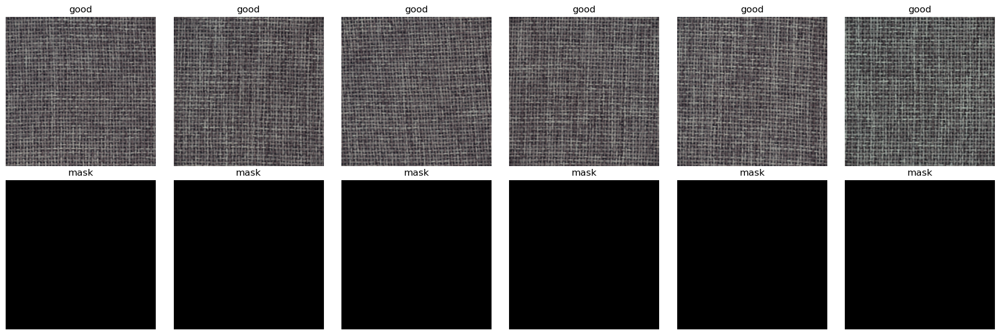

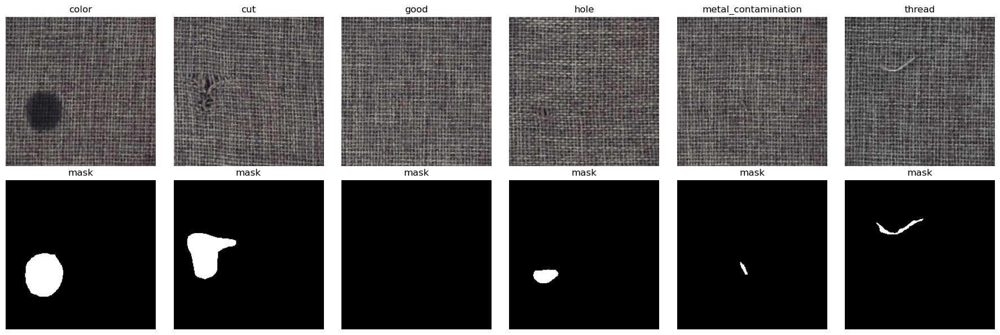

In [6]:
def get_test_subdirs(source, classname):
    """
    Retourne tous les noms de sous-dossiers dans `test/`, y compris 'good'.
    """
    path = os.path.join(source, classname, "test")
    return sorted([d for d in os.listdir(path) if os.path.isdir(os.path.join(path, d))])


def visualize_mvtec(dataloader, split, test_subdirs):
    """
    Affiche n images avec masque (image en haut, masque en bas) où n = nb de sous-dossiers test/
    - TRAIN : n images "good"
    - TEST  : 1 image par sous-dossier (y compris 'good')

    Args:
        dataloader: DataLoader PyTorch.
        split: DatasetSplit.TRAIN ou DatasetSplit.TEST.
        test_subdirs: Liste des sous-dossiers de test (ex : ['good', 'crack', ...])
    """
    samples = []
    seen = set()
    n = len(test_subdirs)

    for batch in dataloader:
        for i in range(len(batch["image"])):
            img = batch["image"][i]
            msk = batch["mask"][i].squeeze(0)  # enlève le 1er axe car c’est un seul canal
            anomaly = batch["anomaly"][i]

            if split == DatasetSplit.TRAIN:
                if anomaly == "good" and len(samples) < n:
                    samples.append((img, msk, "good"))
            else:  # split == TEST
                if anomaly in test_subdirs and anomaly not in seen:
                    seen.add(anomaly)
                    samples.append((img, msk, anomaly))

            if len(samples) >= n:
                break
        if len(samples) >= n:
            break

    # Affichage
    fig, axes = plt.subplots(2, n, figsize=(3 * n, 6))
    if n == 1:
        axes = np.expand_dims(axes, axis=1)

    for idx, (img, msk, label) in enumerate(samples):
        img = (img.permute(1, 2, 0) * 255).byte().cpu().numpy()
        #img = np.clip(img * np.array(std) + np.array(mean), 0, 1)
        msk = msk.cpu().numpy()

        axes[0, idx].imshow(img)
        axes[0, idx].axis("off")
        axes[0, idx].set_title(label)

        axes[1, idx].imshow(msk, cmap="gray")
        axes[1, idx].axis("off")
        axes[1, idx].set_title("mask")

    plt.tight_layout()
    plt.show()


test_subdirs = get_test_subdirs(source, classname)

# Pour le train (images good uniquement)
visualize_mvtec(train_loader, DatasetSplit.TRAIN, test_subdirs)

# Pour le test (1 image par dossier dans test/, y compris 'good')
visualize_mvtec(test_loader, DatasetSplit.TEST, test_subdirs)



In [7]:
from torchvision.models import resnet18, ResNet18_Weights
model = resnet18(weights=ResNet18_Weights.DEFAULT)
# Voir les modules enfants
children = list(model.children())  # or .modules to see all modules
print(f"Nombre total de blocs : {len(children)}")

#for i, layer in enumerate(resnet18.children()):
    #print(f"{i} : {layer}")

# List with names
for i, layer in enumerate(model.named_children()):
    print(f"{i} : {layer}")


x = torch.randn(1, 3, 224, 224)
model= nn.Sequential(*list(model.children())[:5])
out = model(x)
print(out.shape)

Nombre total de blocs : 10
0 : ('conv1', Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False))
1 : ('bn1', BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
2 : ('relu', ReLU(inplace=True))
3 : ('maxpool', MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False))
4 : ('layer1', Sequential(
  (0): BasicBlock(
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (1): BasicBlock(
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(

## Model

In [8]:
class ResnetAE(nn.Module):
    def __init__(self):   # , weights=ResNet18_Weights.DEFAULT , freeze_until="layer2"
        super().__init__()

        # Charger ResNet18 avec les bons poids
        resnet = resnet18(weights=ResNet18_Weights.DEFAULT )

        # Construire l’encodeur (jusqu'à layer n, sans avgpool ni fc)
        self.encoder = nn.Sequential(*list(resnet.children())[:6])

        # Geler les couches jusqu'à un certain niveau
        #self.freeze_encoder_until(freeze_until)

        # Décodeur (reconstruction 224x224)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1),   # 28 → 56
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, 4, stride=2, padding=1),    # 56 → 112
            nn.ReLU(),
            nn.ConvTranspose2d(32, 3, 4, stride=2, padding=1),     # 112 → 224
            nn.Sigmoid()
        )

    def forward(self, x):
        z = self.encoder(x)
        return self.decoder(z)

    def freeze_encoder_until(self, target_layer):

        """Gèle toutes les couches de l'encodeur jusqu'à (inclus) `target_layer`.
        Exemples valides : "0" (conv1), "4" (layer1), "5" (layer2), etc."""

        freezing = True
        for name, module in self.encoder.named_children():
            if freezing:
                for param in module.parameters():
                    param.requires_grad = False
            if name == target_layer:
                freezing = False




#from torchinfo import summary
#model = ResnetAE()
#print(summary(model, input_size=(1, 3, 224, 224), row_settings=["var_names"], device="cpu"))

#from torchvision.models import resnet18, ResNet18_Weights

class AE(nn.Module):
    def __init__(self):
        super().__init__()

        # Charge ResNet18 préentraîné
        resnet = resnet18(weights=ResNet18_Weights.DEFAULT)

        # Encodeur jusqu'à layer3 (donne [B, 128, 28, 28])
        self.encoder = nn.Sequential(*list(resnet.children())[:6])

        # Bottleneck : 128x28x28 → 256x14x14
        self.bottleneck = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),  # réduit la taille spatiale
            nn.ReLU()
        )

        # Décodeur : 256x14x14 → 3x224x224
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1),  # 14 → 28
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1),   # 28 → 56
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, 4, stride=2, padding=1),    # 56 → 112
            nn.ReLU(),
            nn.ConvTranspose2d(32, 3, 4, stride=2, padding=1),     # 112 → 224
            nn.Sigmoid()
        )

    def forward(self, x):
        z = self.encoder(x)            # [B, 128, 28, 28]
        z_bottleneck = self.bottleneck(z)  # [B, 256, 14, 14]
        return self.decoder(z_bottleneck)


# Test the autoencoder architecture
#model = Autoencoder()
model = AE()
input_image = torch.randn(1, 3, 224, 224)  # Sample input image
output_image = model(input_image)
print(output_image.shape)  # Print the shape of the output image

from torchinfo import summary
print(summary(model, input_size=(1, 3, 224, 224), row_settings=["var_names"], device="cpu"))

torch.Size([1, 3, 224, 224])
Layer (type (var_name))                       Output Shape              Param #
AE (AE)                                       [1, 3, 224, 224]          --
├─Sequential (encoder)                        [1, 128, 28, 28]          --
│    └─Conv2d (0)                             [1, 64, 112, 112]         9,408
│    └─BatchNorm2d (1)                        [1, 64, 112, 112]         128
│    └─ReLU (2)                               [1, 64, 112, 112]         --
│    └─MaxPool2d (3)                          [1, 64, 56, 56]           --
│    └─Sequential (4)                         [1, 64, 56, 56]           --
│    │    └─BasicBlock (0)                    [1, 64, 56, 56]           73,984
│    │    └─BasicBlock (1)                    [1, 64, 56, 56]           73,984
│    └─Sequential (5)                         [1, 128, 28, 28]          --
│    │    └─BasicBlock (0)                    [1, 128, 28, 28]          230,144
│    │    └─BasicBlock (1)                    [1,

In [9]:
def train(model, train_loader, optimizer, loss_fn):
    """
    Trains the autoencoder model for one epoch using the provided training data loader.

    Parameters:
    model (torch.nn.Module): The autoencoder model to be trained.
    train_loader (DataLoader): The DataLoader for training data (normal images only).
    optimizer (torch.optim.Optimizer): The optimizer for training.
    loss_fn (callable): The reconstruction loss function (e.g., MSELoss).

    Returns:
    float: Average training loss.
    """
    model.train()  # Set the model to training mode
    model.to(DEVICE)  # Move the model to the selected device (GPU/CPU)

    running_loss = 0.0  # Accumulates total reconstruction loss
    total_samples = 0  # Total number of training samples

    # Iterate through the training data
    for batch in tqdm(train_loader, desc="Training"):
        images = batch["image"].to(DEVICE)  # Extract and move input images to device

        optimizer.zero_grad()  # Clear previous gradients
        outputs = model(images)  # Forward pass: reconstruct input
        loss = loss_fn(outputs, images)  # Compute reconstruction loss

        loss.backward()  # Backward pass: compute gradients
        optimizer.step()  # Update model parameters

        running_loss += loss.item() * images.size(0)  # Accumulate batch loss
        total_samples += images.size(0)  # Update total number of samples

    avg_loss = running_loss / total_samples  # Compute average loss over all samples
    return avg_loss  # Return average loss


In [10]:
def validate(model, val_loader, loss_fn):
    """
    Evaluates the autoencoder model on the provided validation data.

    Parameters:
    model (torch.nn.Module): The autoencoder model to be evaluated.
    val_loader (DataLoader): The DataLoader for validation data.
    loss_fn (callable): The reconstruction loss function (e.g., MSELoss).

    Returns:
    float: Average validation loss.
    """
    model.eval()  # Set the model to evaluation mode (disables dropout, etc.)
    model.to(DEVICE)  # Move the model to the selected device (GPU/CPU)

    running_loss = 0.0  # Accumulates total loss
    total_samples = 0  # Total number of validation samples

    # Iterate through the validation data
    for batch in tqdm(val_loader, desc="Validation"):
        images = batch["image"].to(DEVICE)  # Move input images to device

        with torch.no_grad():  # Disable gradient computation for evaluation
            outputs = model(images)  # Forward pass: reconstruct input
            loss = loss_fn(outputs, images)  # Compute reconstruction loss

        running_loss += loss.item() * images.size(0)  # Accumulate batch loss
        total_samples += images.size(0)  # Count total samples

    avg_loss = running_loss / total_samples  # Compute average validation loss
    return avg_loss  # Return average loss

In [11]:
import logging

def main(model, train_loader, val_loader, optimizer, loss_fn): # writer
    """
    Trains and validates the autoencoder model over multiple epochs.

    Parameters:
    model (torch.nn.Module): The autoencoder model to be trained and validated.
    train_loader (DataLoader): The DataLoader for training data.
    val_loader (DataLoader): The DataLoader for validation data.
    train_config: Configuration object containing training settings (e.g., num_epochs).
    writer (SummaryWriter): TensorBoard writer for logging metrics.

    Returns:
    tuple: Lists of training and validation losses.
    """
    logging.info("Starting training")
    train_losses, val_losses = [], []  # Lists to store loss values

    best_val_loss = float("inf")  # Initialize best validation loss
    best_weights = None  # Store the best model weights

    for epoch in range(train_config.num_epochs):
        train_loss = train(model, train_loader, optimizer, loss_fn)
        val_loss = validate(model, val_loader, loss_fn)

        train_losses.append(train_loss)
        val_losses.append(val_loss)

        # Print training progress
        print(f"Epoch {epoch+1:0>2}/{train_config.num_epochs} - Train Loss: {train_loss:.4f} - Val Loss: {val_loss:.4f}")
        logging.info(f"Epoch {epoch+1:0>2}/{train_config.num_epochs} - Train Loss: {train_loss:.4f} - Val Loss: {val_loss:.4f}")

        # Log metrics to TensorBoard
        # writer.add_scalar('Loss/train', train_loss, epoch)
        # writer.add_scalar('Loss/val', val_loss, epoch)

        # Save the best model based on validation loss
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_weights = model.state_dict()
            print(f"Saving best model...")
            torch.save(best_weights, "best_AE.pt")

    return train_losses, val_losses  # Return training and validation losses


In [12]:
loss_fn = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=train_config.learning_rate)

train_losses, val_losses  = main(model, train_loader, val_loader, optimizer, loss_fn)

Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 01/200 - Train Loss: 0.0310 - Val Loss: 0.0181
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 02/200 - Train Loss: 0.0159 - Val Loss: 0.0181
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 03/200 - Train Loss: 0.0136 - Val Loss: 0.0175
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.62it/s]


Epoch 04/200 - Train Loss: 0.0128 - Val Loss: 0.0154
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 05/200 - Train Loss: 0.0124 - Val Loss: 0.0138
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 06/200 - Train Loss: 0.0122 - Val Loss: 0.0130
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.62it/s]


Epoch 07/200 - Train Loss: 0.0120 - Val Loss: 0.0124
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 08/200 - Train Loss: 0.0118 - Val Loss: 0.0122
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.62it/s]


Epoch 09/200 - Train Loss: 0.0117 - Val Loss: 0.0120
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 10/200 - Train Loss: 0.0116 - Val Loss: 0.0119
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.62it/s]


Epoch 11/200 - Train Loss: 0.0115 - Val Loss: 0.0121


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 12/200 - Train Loss: 0.0115 - Val Loss: 0.0118
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 13/200 - Train Loss: 0.0114 - Val Loss: 0.0120


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 14/200 - Train Loss: 0.0114 - Val Loss: 0.0118
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.62it/s]


Epoch 15/200 - Train Loss: 0.0113 - Val Loss: 0.0116
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.62it/s]


Epoch 16/200 - Train Loss: 0.0113 - Val Loss: 0.0118


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 17/200 - Train Loss: 0.0113 - Val Loss: 0.0116
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 18/200 - Train Loss: 0.0112 - Val Loss: 0.0115
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 19/200 - Train Loss: 0.0109 - Val Loss: 0.0111
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 20/200 - Train Loss: 0.0104 - Val Loss: 0.0106
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 21/200 - Train Loss: 0.0099 - Val Loss: 0.0100
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 22/200 - Train Loss: 0.0093 - Val Loss: 0.0092
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 23/200 - Train Loss: 0.0085 - Val Loss: 0.0088
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 24/200 - Train Loss: 0.0076 - Val Loss: 0.0082
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 25/200 - Train Loss: 0.0071 - Val Loss: 0.0076
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 26/200 - Train Loss: 0.0067 - Val Loss: 0.0068
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 27/200 - Train Loss: 0.0064 - Val Loss: 0.0066
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 28/200 - Train Loss: 0.0061 - Val Loss: 0.0064
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 29/200 - Train Loss: 0.0059 - Val Loss: 0.0062
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 30/200 - Train Loss: 0.0058 - Val Loss: 0.0060
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 31/200 - Train Loss: 0.0057 - Val Loss: 0.0060
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 32/200 - Train Loss: 0.0056 - Val Loss: 0.0058
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.62it/s]


Epoch 33/200 - Train Loss: 0.0055 - Val Loss: 0.0058
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.62it/s]


Epoch 34/200 - Train Loss: 0.0054 - Val Loss: 0.0055
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 35/200 - Train Loss: 0.0052 - Val Loss: 0.0055
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.62it/s]


Epoch 36/200 - Train Loss: 0.0051 - Val Loss: 0.0053
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 37/200 - Train Loss: 0.0050 - Val Loss: 0.0054


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 38/200 - Train Loss: 0.0048 - Val Loss: 0.0051
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 39/200 - Train Loss: 0.0048 - Val Loss: 0.0050
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 40/200 - Train Loss: 0.0048 - Val Loss: 0.0048
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 41/200 - Train Loss: 0.0047 - Val Loss: 0.0049


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 42/200 - Train Loss: 0.0045 - Val Loss: 0.0048


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 43/200 - Train Loss: 0.0044 - Val Loss: 0.0046
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.60it/s]


Epoch 44/200 - Train Loss: 0.0043 - Val Loss: 0.0045
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 45/200 - Train Loss: 0.0043 - Val Loss: 0.0044
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 46/200 - Train Loss: 0.0042 - Val Loss: 0.0043
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 47/200 - Train Loss: 0.0041 - Val Loss: 0.0043
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 48/200 - Train Loss: 0.0040 - Val Loss: 0.0043
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 49/200 - Train Loss: 0.0040 - Val Loss: 0.0041
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.66it/s]


Epoch 50/200 - Train Loss: 0.0039 - Val Loss: 0.0041
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 51/200 - Train Loss: 0.0038 - Val Loss: 0.0040
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 52/200 - Train Loss: 0.0038 - Val Loss: 0.0040
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 53/200 - Train Loss: 0.0038 - Val Loss: 0.0040
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.66it/s]


Epoch 54/200 - Train Loss: 0.0038 - Val Loss: 0.0040
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 55/200 - Train Loss: 0.0037 - Val Loss: 0.0039
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 56/200 - Train Loss: 0.0036 - Val Loss: 0.0038
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 57/200 - Train Loss: 0.0036 - Val Loss: 0.0038


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 58/200 - Train Loss: 0.0036 - Val Loss: 0.0037
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 59/200 - Train Loss: 0.0035 - Val Loss: 0.0037
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 60/200 - Train Loss: 0.0036 - Val Loss: 0.0038


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 61/200 - Train Loss: 0.0035 - Val Loss: 0.0036
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 62/200 - Train Loss: 0.0034 - Val Loss: 0.0036
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 63/200 - Train Loss: 0.0035 - Val Loss: 0.0037


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 64/200 - Train Loss: 0.0035 - Val Loss: 0.0036


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 65/200 - Train Loss: 0.0034 - Val Loss: 0.0035
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.62it/s]


Epoch 66/200 - Train Loss: 0.0033 - Val Loss: 0.0036


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 67/200 - Train Loss: 0.0033 - Val Loss: 0.0035
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 68/200 - Train Loss: 0.0033 - Val Loss: 0.0035


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.61it/s]


Epoch 69/200 - Train Loss: 0.0033 - Val Loss: 0.0034
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 70/200 - Train Loss: 0.0033 - Val Loss: 0.0034
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 71/200 - Train Loss: 0.0034 - Val Loss: 0.0035


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 72/200 - Train Loss: 0.0033 - Val Loss: 0.0034
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 73/200 - Train Loss: 0.0032 - Val Loss: 0.0033
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 74/200 - Train Loss: 0.0032 - Val Loss: 0.0035


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 75/200 - Train Loss: 0.0032 - Val Loss: 0.0033
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 76/200 - Train Loss: 0.0032 - Val Loss: 0.0033
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 77/200 - Train Loss: 0.0032 - Val Loss: 0.0033


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 78/200 - Train Loss: 0.0031 - Val Loss: 0.0033


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 79/200 - Train Loss: 0.0031 - Val Loss: 0.0032
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 80/200 - Train Loss: 0.0031 - Val Loss: 0.0032
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.59it/s]


Epoch 81/200 - Train Loss: 0.0031 - Val Loss: 0.0032
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 82/200 - Train Loss: 0.0030 - Val Loss: 0.0033


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 83/200 - Train Loss: 0.0031 - Val Loss: 0.0033


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 84/200 - Train Loss: 0.0031 - Val Loss: 0.0031
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 85/200 - Train Loss: 0.0030 - Val Loss: 0.0031
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 86/200 - Train Loss: 0.0030 - Val Loss: 0.0031
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 87/200 - Train Loss: 0.0030 - Val Loss: 0.0031
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 88/200 - Train Loss: 0.0029 - Val Loss: 0.0031
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 89/200 - Train Loss: 0.0029 - Val Loss: 0.0031


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.62it/s]


Epoch 90/200 - Train Loss: 0.0030 - Val Loss: 0.0031


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 91/200 - Train Loss: 0.0030 - Val Loss: 0.0031


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 92/200 - Train Loss: 0.0029 - Val Loss: 0.0030
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 93/200 - Train Loss: 0.0029 - Val Loss: 0.0031


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 94/200 - Train Loss: 0.0029 - Val Loss: 0.0030
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 95/200 - Train Loss: 0.0029 - Val Loss: 0.0030
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.59it/s]


Epoch 96/200 - Train Loss: 0.0029 - Val Loss: 0.0030


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.62it/s]


Epoch 97/200 - Train Loss: 0.0029 - Val Loss: 0.0031


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 98/200 - Train Loss: 0.0029 - Val Loss: 0.0030
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 99/200 - Train Loss: 0.0028 - Val Loss: 0.0029
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 100/200 - Train Loss: 0.0028 - Val Loss: 0.0029
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 101/200 - Train Loss: 0.0028 - Val Loss: 0.0029
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.66it/s]


Epoch 102/200 - Train Loss: 0.0028 - Val Loss: 0.0030


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 103/200 - Train Loss: 0.0028 - Val Loss: 0.0029


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 104/200 - Train Loss: 0.0028 - Val Loss: 0.0029
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 105/200 - Train Loss: 0.0029 - Val Loss: 0.0030


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 106/200 - Train Loss: 0.0028 - Val Loss: 0.0030


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 107/200 - Train Loss: 0.0028 - Val Loss: 0.0029


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 108/200 - Train Loss: 0.0028 - Val Loss: 0.0028
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 109/200 - Train Loss: 0.0027 - Val Loss: 0.0029


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 110/200 - Train Loss: 0.0027 - Val Loss: 0.0028
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 111/200 - Train Loss: 0.0027 - Val Loss: 0.0028


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 112/200 - Train Loss: 0.0027 - Val Loss: 0.0028
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 113/200 - Train Loss: 0.0027 - Val Loss: 0.0028


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 114/200 - Train Loss: 0.0027 - Val Loss: 0.0028


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 115/200 - Train Loss: 0.0027 - Val Loss: 0.0028


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 116/200 - Train Loss: 0.0027 - Val Loss: 0.0028
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.61it/s]


Epoch 117/200 - Train Loss: 0.0026 - Val Loss: 0.0028


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 118/200 - Train Loss: 0.0027 - Val Loss: 0.0028


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 119/200 - Train Loss: 0.0026 - Val Loss: 0.0028
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 120/200 - Train Loss: 0.0026 - Val Loss: 0.0027
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 121/200 - Train Loss: 0.0026 - Val Loss: 0.0028


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 122/200 - Train Loss: 0.0027 - Val Loss: 0.0028


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 123/200 - Train Loss: 0.0026 - Val Loss: 0.0028


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 124/200 - Train Loss: 0.0027 - Val Loss: 0.0029


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 125/200 - Train Loss: 0.0027 - Val Loss: 0.0028


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 126/200 - Train Loss: 0.0027 - Val Loss: 0.0027


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.62it/s]


Epoch 127/200 - Train Loss: 0.0026 - Val Loss: 0.0027
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 128/200 - Train Loss: 0.0026 - Val Loss: 0.0027
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 129/200 - Train Loss: 0.0026 - Val Loss: 0.0027


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 130/200 - Train Loss: 0.0025 - Val Loss: 0.0026
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 131/200 - Train Loss: 0.0025 - Val Loss: 0.0026


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 132/200 - Train Loss: 0.0025 - Val Loss: 0.0027


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 133/200 - Train Loss: 0.0025 - Val Loss: 0.0027


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 134/200 - Train Loss: 0.0025 - Val Loss: 0.0026
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 135/200 - Train Loss: 0.0025 - Val Loss: 0.0026
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 136/200 - Train Loss: 0.0025 - Val Loss: 0.0026


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 137/200 - Train Loss: 0.0025 - Val Loss: 0.0026


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 138/200 - Train Loss: 0.0025 - Val Loss: 0.0026


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 139/200 - Train Loss: 0.0025 - Val Loss: 0.0025
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 140/200 - Train Loss: 0.0024 - Val Loss: 0.0025
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 141/200 - Train Loss: 0.0024 - Val Loss: 0.0025


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 142/200 - Train Loss: 0.0024 - Val Loss: 0.0026


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 143/200 - Train Loss: 0.0024 - Val Loss: 0.0025
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 144/200 - Train Loss: 0.0023 - Val Loss: 0.0024
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 145/200 - Train Loss: 0.0024 - Val Loss: 0.0026


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 146/200 - Train Loss: 0.0024 - Val Loss: 0.0025


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 147/200 - Train Loss: 0.0023 - Val Loss: 0.0025


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 148/200 - Train Loss: 0.0025 - Val Loss: 0.0027


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 149/200 - Train Loss: 0.0024 - Val Loss: 0.0024
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.62it/s]


Epoch 150/200 - Train Loss: 0.0023 - Val Loss: 0.0024
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 151/200 - Train Loss: 0.0023 - Val Loss: 0.0024
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.66it/s]


Epoch 152/200 - Train Loss: 0.0022 - Val Loss: 0.0023
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.61it/s]


Epoch 153/200 - Train Loss: 0.0022 - Val Loss: 0.0024


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 154/200 - Train Loss: 0.0022 - Val Loss: 0.0023
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 155/200 - Train Loss: 0.0022 - Val Loss: 0.0022
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 156/200 - Train Loss: 0.0022 - Val Loss: 0.0023


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 157/200 - Train Loss: 0.0022 - Val Loss: 0.0023


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 158/200 - Train Loss: 0.0021 - Val Loss: 0.0023


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 159/200 - Train Loss: 0.0021 - Val Loss: 0.0023


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.62it/s]


Epoch 160/200 - Train Loss: 0.0021 - Val Loss: 0.0024


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 161/200 - Train Loss: 0.0022 - Val Loss: 0.0022


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 162/200 - Train Loss: 0.0021 - Val Loss: 0.0021
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 163/200 - Train Loss: 0.0021 - Val Loss: 0.0021


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 164/200 - Train Loss: 0.0020 - Val Loss: 0.0021
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 165/200 - Train Loss: 0.0020 - Val Loss: 0.0022


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 166/200 - Train Loss: 0.0021 - Val Loss: 0.0022


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 167/200 - Train Loss: 0.0021 - Val Loss: 0.0023


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 168/200 - Train Loss: 0.0020 - Val Loss: 0.0022


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 169/200 - Train Loss: 0.0020 - Val Loss: 0.0021
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.62it/s]


Epoch 170/200 - Train Loss: 0.0020 - Val Loss: 0.0020
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 171/200 - Train Loss: 0.0020 - Val Loss: 0.0021


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 172/200 - Train Loss: 0.0020 - Val Loss: 0.0021


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.66it/s]


Epoch 173/200 - Train Loss: 0.0020 - Val Loss: 0.0021


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 174/200 - Train Loss: 0.0019 - Val Loss: 0.0020
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 175/200 - Train Loss: 0.0019 - Val Loss: 0.0020


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 176/200 - Train Loss: 0.0019 - Val Loss: 0.0020
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 177/200 - Train Loss: 0.0019 - Val Loss: 0.0020


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.62it/s]


Epoch 178/200 - Train Loss: 0.0019 - Val Loss: 0.0020


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 179/200 - Train Loss: 0.0019 - Val Loss: 0.0020


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 180/200 - Train Loss: 0.0020 - Val Loss: 0.0022


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 181/200 - Train Loss: 0.0020 - Val Loss: 0.0020


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.66it/s]


Epoch 182/200 - Train Loss: 0.0019 - Val Loss: 0.0020


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 183/200 - Train Loss: 0.0019 - Val Loss: 0.0020


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 184/200 - Train Loss: 0.0019 - Val Loss: 0.0019
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 185/200 - Train Loss: 0.0018 - Val Loss: 0.0019
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 186/200 - Train Loss: 0.0018 - Val Loss: 0.0019


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 187/200 - Train Loss: 0.0018 - Val Loss: 0.0020


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.62it/s]


Epoch 188/200 - Train Loss: 0.0018 - Val Loss: 0.0020


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 189/200 - Train Loss: 0.0018 - Val Loss: 0.0019


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 190/200 - Train Loss: 0.0018 - Val Loss: 0.0019


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 191/200 - Train Loss: 0.0018 - Val Loss: 0.0019


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 192/200 - Train Loss: 0.0018 - Val Loss: 0.0019
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


Epoch 193/200 - Train Loss: 0.0018 - Val Loss: 0.0018
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 194/200 - Train Loss: 0.0017 - Val Loss: 0.0018
Saving best model...


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 195/200 - Train Loss: 0.0017 - Val Loss: 0.0018


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 196/200 - Train Loss: 0.0018 - Val Loss: 0.0020


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 197/200 - Train Loss: 0.0018 - Val Loss: 0.0020


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


Epoch 198/200 - Train Loss: 0.0018 - Val Loss: 0.0019


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


Epoch 199/200 - Train Loss: 0.0018 - Val Loss: 0.0019


Validation: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]

Epoch 200/200 - Train Loss: 0.0018 - Val Loss: 0.0020


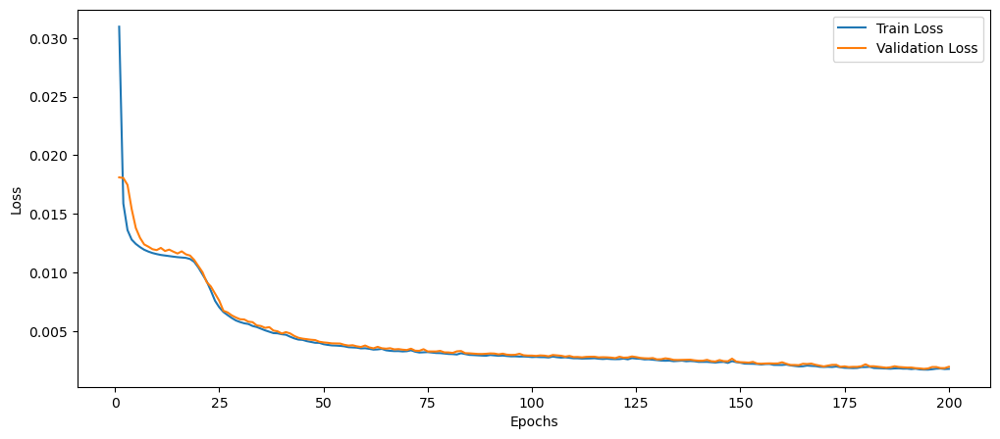

In [13]:
import matplotlib.pyplot as plt  # Importing Matplotlib for visualization

# Create a new figure with specified size
plt.figure(figsize=(12, 5))

# Plot training and validation loss over epochs
#plt.subplot(1, 2, 1)  # Create subplot (1 row, 2 columns, 1st plot)
plt.plot(range(1, train_config.num_epochs + 1), train_losses, label="Train Loss")  # Plot train loss
plt.plot(range(1, train_config.num_epochs + 1), val_losses, label="Validation Loss")  # Plot validation loss
plt.xlabel("Epochs")  # Label for x-axis
plt.ylabel("Loss")  # Label for y-axis
plt.legend()  # Show legend to differentiate lines

In [14]:
# Load the best model weights
model.load_state_dict(torch.load("best_AE.pt"))
print(model.eval())

AE(
  (encoder): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    

/tmp/ipykernel_27745/278656968.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("best_AE.pt"))


## Inférence

In [15]:
def prediction(model, dataloader):
    """
    Generates predictions for given dataloader.
    Parameters:
        model (torch.nn.Module): The autoencoder model to be evaluated.
        dataloader (DataLoader): The DataLoader for validation or test data.
    """
    model.eval()           # Set the model to evaluation mode
    model.to(DEVICE)       # Move the model to the appropriate DEVICE (CPU/GPU)

    all_images, all_labels = [], []
    all_predictions, all_masks = [], []

    # Iterate over the dataloader
    for batch in tqdm(dataloader, desc="Generating predictions"):
        images = batch["image"].to(DEVICE)
        labels = batch["mask"].to(DEVICE)

        with torch.inference_mode():    # Disable gradient calculations for efficiency
            outputs = model(images) # Reconstructed images from the autoencoder

        # Compute per-pixel reconstruction error (MSE) across channels
        masks = ((images - outputs) ** 2).mean(dim=1)  # Shape: [B, H, W]
        #print(recon_error.shape)

        all_images.append(images.cpu())
        all_labels.append(labels.cpu())
        all_predictions.append(outputs.cpu())
        all_masks.append(masks.cpu())

    return(
        torch.cat(all_images).numpy(),
        torch.cat(all_labels).numpy(),
        torch.cat(all_predictions).numpy(),
        torch.cat(all_masks).numpy(),
    )

In [16]:
import matplotlib.pyplot as plt
import numpy as np
import random

def visualise_predictions(images, labels, reconstructions, error_maps, num_images=3):
    """
    Visualise original images, ground truth masks, reconstructions, and anomaly maps.

    Parameters:
        images (np.ndarray): Original images [B, C, H, W].
        labels (np.ndarray): Ground truth masks [B, 1, H, W] or [B, H, W].
        error_maps (np.ndarray): Reconstruction errors [B, H, W].
        reconstructions (np.ndarray): Reconstructed images [B, C, H, W].
        num_images (int): Number of samples to display.
    """
    fig, axes = plt.subplots(num_images, 4, figsize=(16, 4 * num_images))

    for i in range(num_images):
        idx = random.randint(0, len(images) - 1)

        # Colonne 0 : Original
        img = np.transpose(images[idx], (1, 2, 0))
        img = np.clip(img, 0, 1)
        axes[i, 0].imshow(img)
        axes[i, 0].set_title("Original")
        axes[i, 0].axis('off')

        # Colonne 1 : Masque
        label = labels[idx]
        if label.ndim == 3:
            label = label[0]
        axes[i, 1].imshow(label, cmap="gray")
        axes[i, 1].set_title("Ground Truth")
        axes[i, 1].axis('off')

        # Colonne 2 : Reconstruction
        recon = np.transpose(reconstructions[idx], (1, 2, 0))
        recon = np.clip(recon, 0, 1)
        axes[i, 2].imshow(recon)
        axes[i, 2].set_title("Reconstruction")
        axes[i, 2].axis('off')

        # Colonne 3 : Anomaly map
        err = error_maps[idx]
        axes[i, 3].imshow(err, cmap="jet", vmax=error_maps[idx].max())
        axes[i, 3].set_title("Anomaly Map")
        axes[i, 3].axis('off')

    plt.tight_layout()
    plt.show()



Generating predictions: 100%|██████████| 7/7 [00:04<00:00,  1.54it/s]


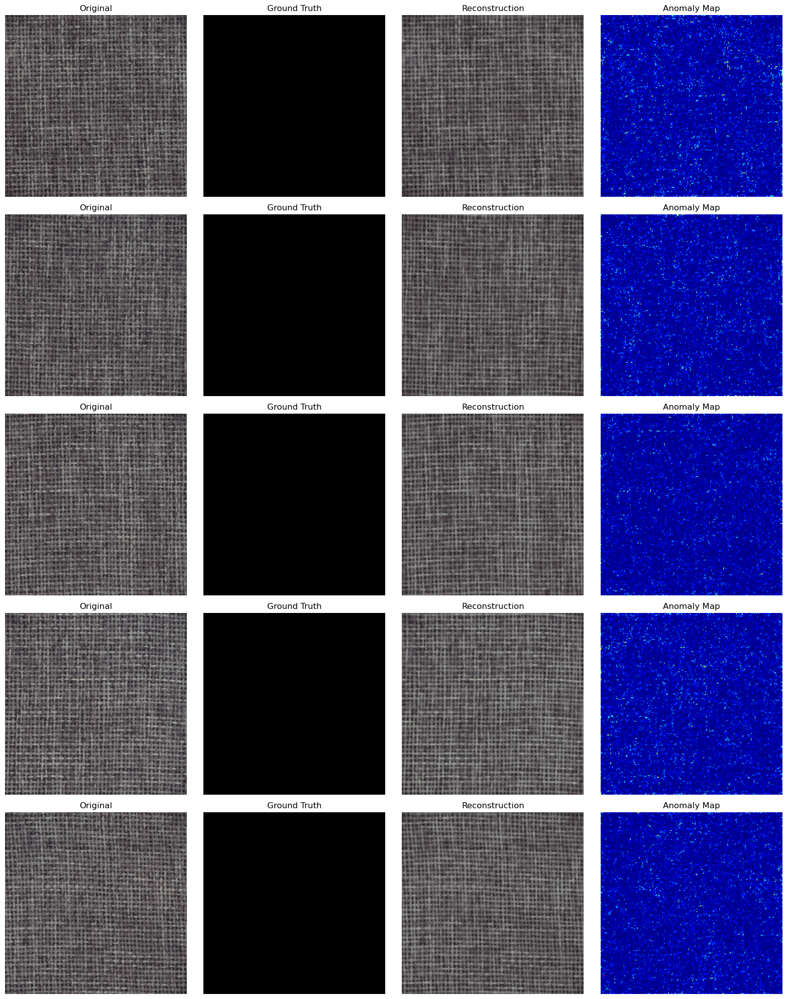

In [17]:
images, labels, recons, errors = prediction(model, train_loader)
visualise_predictions(images, labels, recons, errors, num_images=5)

Generating predictions: 100%|██████████| 4/4 [00:02<00:00,  1.62it/s]


images test shape : (117, 3, 224, 224)
labels test shape : (117, 1, 224, 224)
recons test shape : (117, 3, 224, 224)
errors test shape : (117, 224, 224)


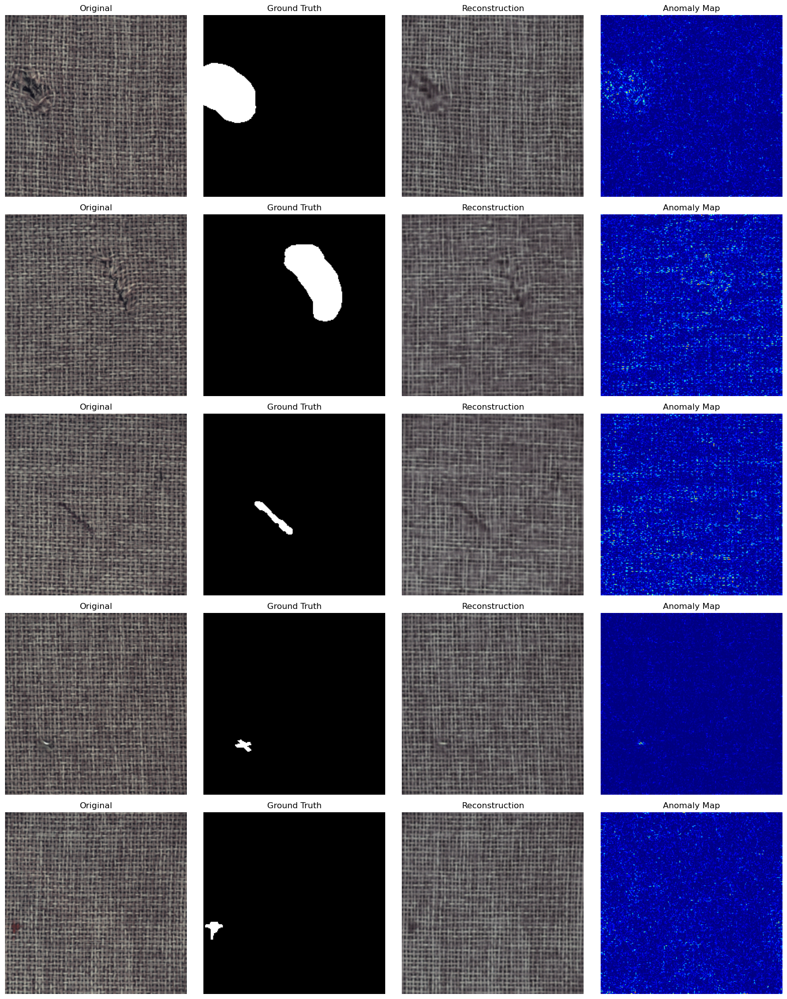

In [18]:
images, labels, recons, errors = prediction(model, test_loader)
print('images test shape :',  images.shape)
print('labels test shape :', labels.shape)
print('recons test shape :', recons.shape)
print('errors test shape :', errors.shape)

visualise_predictions(images, labels, recons, errors, num_images=5)

## Evaluation

Outputs metrics value :  {'auroc': 0.600739277014174, 'fpr': array([0.        , 0.        , 0.        , ..., 0.99999325, 0.99999325,
       1.        ]), 'tpr': array([0.00000000e+00, 1.06242829e-05, 1.06242829e-04, ...,
       9.99989376e-01, 1.00000000e+00, 1.00000000e+00]), 'optimal_threshold': 0.009792665, 'optimal_fpr': 0.03676750147174254, 'optimal_fnr': 0.014288678211669284}


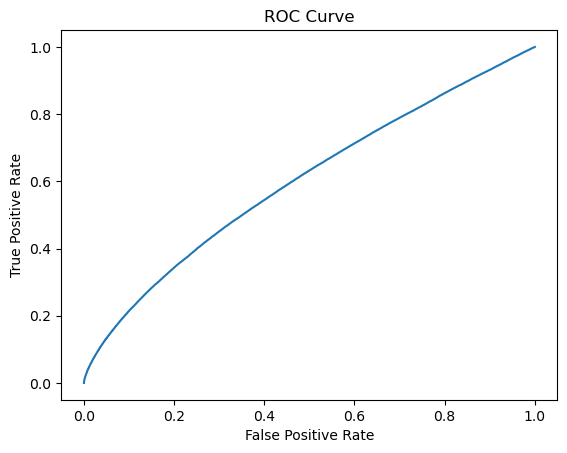

In [19]:
from metrics import compute_pixelwise_retrieval_metrics
metrics = compute_pixelwise_retrieval_metrics(errors, labels)

print("Outputs metrics value : ", metrics)


plt.plot(metrics["fpr"], metrics["tpr"])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.show()

## Final detection mask

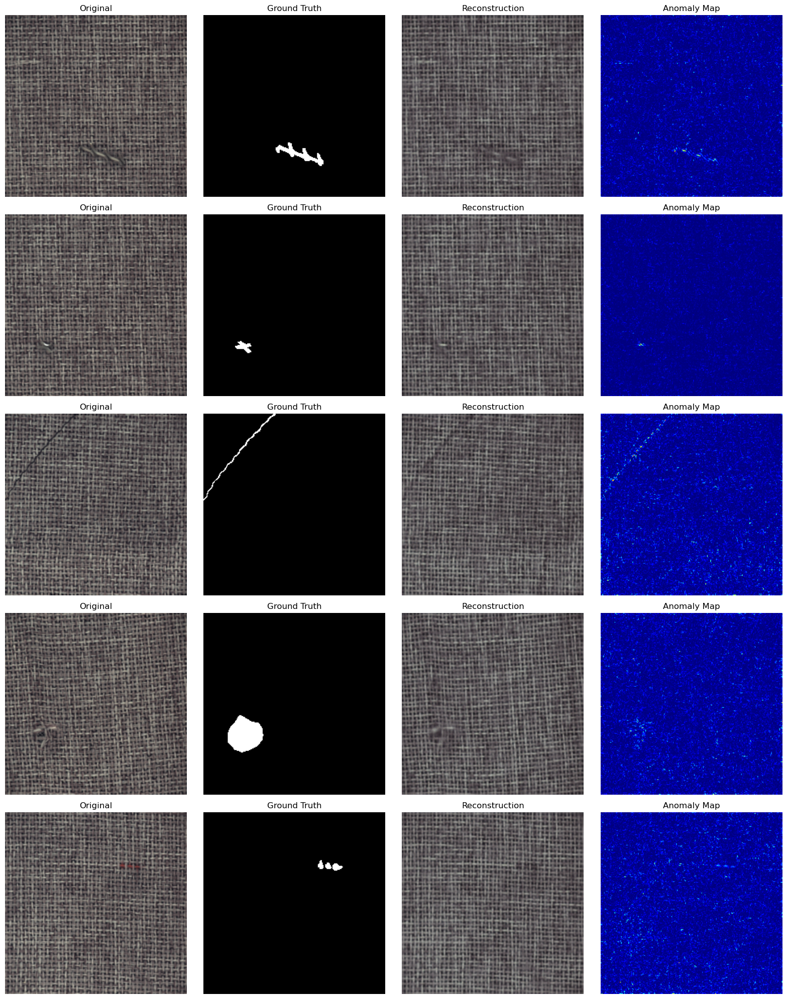

In [20]:
binary_prediction = (errors >= metrics["optimal_threshold"]).astype(np.uint8)

visualise_predictions(images, labels, recons, errors, num_images=5)